# Forest Species Distribution Modeling Analysis

This notebook provides a comprehensive analysis of forest species distribution modeling, including:
1. Environment setup and verification
2. Data requirements and explanation
3. Model implementation and evaluation

## Table of Contents
1. [Environment Setup](#environment-setup)
2. [Data Requirements](#data-requirements)
3. [Model Implementation](#model-implementation)
4. [Results and Visualization](#results-and-visualization)

## 1. Environment Setup

First, let's verify our Python environment and required packages.

In [19]:
import sys
print(f"Python version: {sys.version}")

# List of required packages
required_packages = [
    'numpy',
    'pandas',
    'matplotlib',
    'seaborn',
    'scipy',
    'statsmodels',
    'sklearn',
    'xgboost',
    'basemap'
]

# Check package versions
for package in required_packages:
    try:
        module = __import__(package)
        print(f"{package}: {module.__version__}")
    except ImportError:
        print(f"{package}: Not installed")
    except AttributeError:
        print(f"{package}: Version unknown")

Python version: 3.11.7 (main, Dec  4 2023, 18:10:11) [Clang 15.0.0 (clang-1500.1.0.2.5)]
numpy: 1.26.4
pandas: 2.2.3
matplotlib: 3.8.4
seaborn: 0.13.2
scipy: 1.15.2
statsmodels: 0.14.4
sklearn: 1.6.1
xgboost: 3.0.0
basemap: Not installed


## 2. Data Requirements

Let's examine the required data files and their purposes.

In [20]:
import os
import pandas as pd

# Define required data files
required_files = {
    'presence_data.csv': 'Species presence/absence data',
    'feature_1991_2020.csv': 'Environmental features for 1991-2020 period',
    'background_131': 'Background points for Loblolly pine',
    'background_110': 'Background points for Shortleaf pine',
    'background_111': 'Background points for Slash pine',
    'background_121': 'Background points for Longleaf pine',
    'predictions_126.csv': 'Prediction data for SSP1-2.6',
    'predictions_245.csv': 'Prediction data for SSP2-4.5',
    'predictions_370.csv': 'Prediction data for SSP3-7.0'
}

# Check file existence and sizes
print("Data File Check:")
print("-" * 50)
for file, description in required_files.items():
    path = os.path.join('dataset', file)
    if os.path.exists(path):
        size = os.path.getsize(path) / (1024*1024)  # Convert to MB
        print(f"✓ {file:<30} {description:<30} {size:.1f} MB")
    else:
        print(f"✗ {file:<30} {description:<30} Missing")

Data File Check:
--------------------------------------------------
✓ presence_data.csv              Species presence/absence data  3.0 MB
✓ feature_1991_2020.csv          Environmental features for 1991-2020 period 10.1 MB
✓ background_131                 Background points for Loblolly pine 0.2 MB
✓ background_110                 Background points for Shortleaf pine 0.4 MB
✓ background_111                 Background points for Slash pine 0.6 MB
✓ background_121                 Background points for Longleaf pine 0.6 MB
✓ predictions_126.csv            Prediction data for SSP1-2.6   37.1 MB
✓ predictions_245.csv            Prediction data for SSP2-4.5   37.1 MB
✓ predictions_370.csv            Prediction data for SSP3-7.0   37.1 MB


### Data Explanation

1. **Presence Data** (`presence_data.csv`):
   - Contains actual species occurrence records
   - Used for training the species distribution models

2. **Feature Data** (`feature_*.csv`):
   - Environmental variables for different time periods
   - Used as predictors in the models
   - Includes climate and environmental features

3. **Background Points** (`background_*`):
   - Pseudo-absence points for each species
   - Used to create balanced training data
   - Species codes: 131 (Loblolly), 110 (Shortleaf), 111 (Slash), 121 (Longleaf)

4. **Prediction Data** (`predictions_*.csv`):
   - Future climate scenarios (SSP1-2.6, SSP2-4.5, SSP3-7.0)
   - Used for making future distribution predictions

## 3. Model Implementation

Let's implement the core functionality from `eval_base.py` and `pred.py`.

### Data Preprocessing Functions

In [21]:
def load_and_preprocess_data(year):
    """Load and preprocess the data for a specific time period."""
    # Load data
    y_data = pd.read_csv('dataset/presence_data.csv')
    x_data = pd.read_csv(f'dataset/feature_{year}.csv')
    x_data.drop(x_data.columns[0], axis=1, inplace=True)
    
    # Join data
    join_data = pd.concat([y_data, x_data], axis=1)
    
    # Outlier elimination
    feature_names = join_data.columns[6:].tolist()
    join_data = join_data[(np.abs(stats.zscore(join_data[feature_names])) < 3).all(axis=1)]
    
    # Split features and target
    x_data = join_data.iloc[:,6:]
    y_data = join_data.iloc[:,:6]
    
    # Normalization
    mean = x_data.mean(axis=0)
    std = x_data.std(axis=0)
    x_data = (x_data - mean) / std
    
    return x_data, y_data, mean, std

### Model Training and Evaluation Functions

In [22]:
def train_and_evaluate_models(x_data, y_data):
    """Train and evaluate multiple models."""
    stats_label = ["Accuracy", "ROC AUC", "Kappa"]
    sss = StratifiedShuffleSplit(n_splits=10, test_size=0.3, random_state=42)
    
    # Initialize models
    models = {
        # 'SVM': svm.SVC(kernel='poly', probability=True),
        'GLM': None,  # Special case
        'GBM': GradientBoostingClassifier(),
        'RF': RandomForestClassifier(),
        'NBM': GaussianNB(),
        'XGB': xgb.XGBClassifier(),
        'MAXENT': LogisticRegression(max_iter=1000)
    }
    
    results = {}
    
    for name, model in models.items():
        print(f"Training {name}...")
        ROC_AUC = []
        Accuracy = []
        Kappa = []
        
        for train_index, test_index in sss.split(x_data, y_data):
            X_train, X_test = x_data.iloc[train_index], x_data.iloc[test_index]
            y_train, y_test = y_data.iloc[train_index], y_data.iloc[test_index]
            
            if name == 'GLM':
                X_glm_train = sm.add_constant(X_train)
                glm = sm.GLM(y_train, X_glm_train, family=sm.families.Binomial())
                result = glm.fit()
                X_glm_test = sm.add_constant(X_test)
                y_pred = result.predict(X_glm_test)
                y_pred = [0 if x < 0.5 else 1 for x in y_pred]
            else:
                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)
            
            Accuracy.append(metrics.accuracy_score(y_test, y_pred))
            ROC_AUC.append(metrics.roc_auc_score(y_test, y_pred))
            Kappa.append(metrics.cohen_kappa_score(y_test, y_pred))
        
        results[name] = [np.mean(Accuracy), np.mean(ROC_AUC), np.mean(Kappa)]
    
    return results, stats_label

### Visualization Functions

In [ ]:
!pip install jupyter notebook matplotlib seaborn pandas numpy scipy scikit-learn statsmodels xgboost basemap

In [23]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import train_test_split
import scipy.optimize as opt
from sklearn import svm
import statsmodels.api as sm
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from mpl_toolkits.basemap import Basemap
import json
import os
import gc
from IPython.display import display

# Jupyter magic commands for better visualization
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Configure matplotlib parameters directly
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.3
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'
plt.rcParams['savefig.edgecolor'] = 'none'

# Set seaborn parameters without using theme
sns.set_context("notebook", font_scale=1.2)
sns.set_palette("husl")

In [24]:
def plot_model_comparison(results, stats_label, species_name, year):
    """Create comparison plot for all models."""
    # Create figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Convert results to DataFrame for easier plotting
    results_df = pd.DataFrame(results, index=stats_label).T
    
    # Set colors for different models
    colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC', '#99FFCC', '#FFB366']
    
    # Plot 1: Scatter plot with connecting lines
    for idx, (model_name, stats) in enumerate(results.items()):
        ax1.plot(stats_label, stats, 'o-', label=model_name, 
                linewidth=2, markersize=8, color=colors[idx])
    
    ax1.set_title(f"Model Performance Comparison\n{species_name} ({year})", pad=20)
    ax1.set_xlabel("Evaluation Metrics")
    ax1.set_ylabel("Score")
    ax1.grid(True, alpha=0.3)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Plot 2: Heatmap
    sns.heatmap(results_df, 
                annot=True,
                fmt='.3f',
                cmap='RdYlGn',
                center=0.5,
                ax=ax2,
                cbar_kws={'label': 'Score'})
    
    ax2.set_title(f"Model Performance Heatmap\n{species_name} ({year})", pad=20)
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    
    # Save the plot
    os.makedirs('plot_all/base/'+year, exist_ok=True)
    plt.savefig(f'plot_all/base/{year}/{year}_{species_name}_metrics.png', 
                bbox_inches='tight',
                dpi=300)
    
    # Display the plot in the notebook
    display(fig)
    
    # Create a summary table
    print("\nModel Performance Summary:")
    print("-" * 50)
    print(results_df.round(3))
    
    # Find best model for each metric
    best_models = results_df.idxmax()
    print("\nBest Models for Each Metric:")
    print("-" * 50)
    for metric, model in best_models.items():
        print(f"{metric}: {model} ({results_df.loc[model, metric]:.3f})")

Species data size: 47031
Non-species data size: 0
Final training data size: 40000
Presence samples: 20000
Absence samples: 20000
Training GLM...
Training GBM...
Training RF...
Training NBM...
Training XGB...
Training MAXENT...


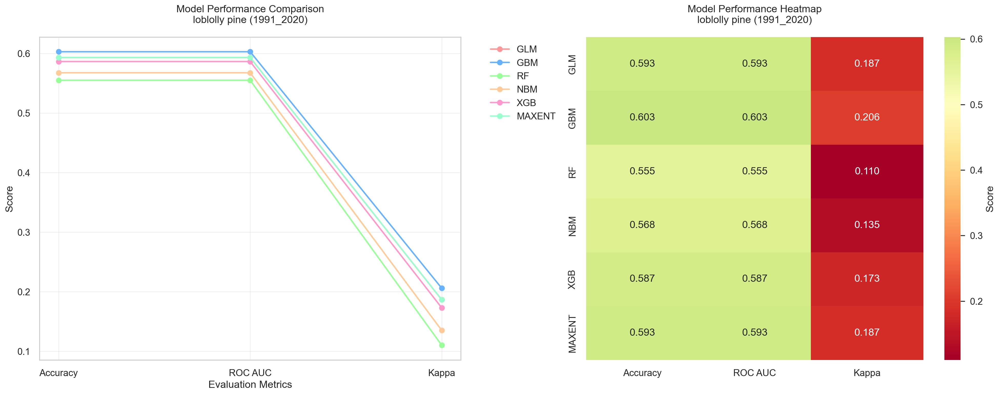


Model Performance Summary:
--------------------------------------------------
        Accuracy  ROC AUC  Kappa
GLM        0.593    0.593  0.187
GBM        0.603    0.603  0.206
RF         0.555    0.555  0.110
NBM        0.568    0.568  0.135
XGB        0.587    0.587  0.173
MAXENT     0.593    0.593  0.187

Best Models for Each Metric:
--------------------------------------------------
Accuracy: GBM (0.603)
ROC AUC: GBM (0.603)
Kappa: GBM (0.206)


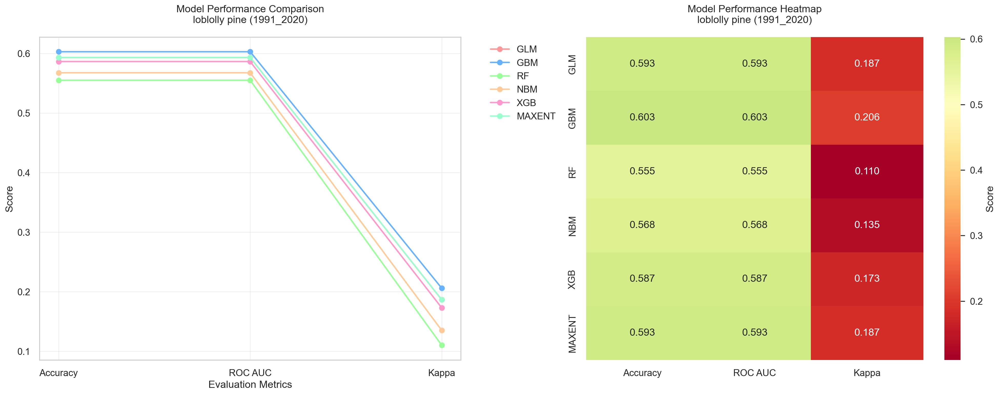

In [25]:
# Test with a single species
SPCD = 131  # Loblolly pine
year = '1991_2020'

# Load and preprocess data
x_data, y_data, mean, std = load_and_preprocess_data(year)

# Load background points
with open(f"dataset/background_{SPCD}", "r") as fp:
    non_species = json.load(fp)

# Prepare training data
species_data = pd.concat([y_data, x_data], axis=1)
species_data = species_data[species_data['SPCD'] == SPCD]
non_species_data = species_data[species_data['index'].isin(non_species)]

# Print data sizes to debug
print(f"Species data size: {len(species_data)}")
print(f"Non-species data size: {len(non_species_data)}")

# Assign presence/absence labels
species_data = species_data.assign(PRESENCE=1)  # Presence points
non_species_data = non_species_data.assign(PRESENCE=0)  # Absence points

# Balance the dataset
n_samples = min(20000, len(species_data))  # Adjust sample size if needed
species_data = species_data.sample(n=n_samples, random_state=42)

# For non-species data, we need to get more samples from the original data
# that are not in the species data
all_data = pd.concat([y_data, x_data], axis=1)
non_species_data = all_data[~all_data['index'].isin(species_data['index'])]
non_species_data = non_species_data.sample(n=n_samples, random_state=42)
non_species_data = non_species_data.assign(PRESENCE=0)

# Combine presence and absence data
join_data = pd.concat([species_data, non_species_data], axis=0)

# Print final data sizes
print(f"Final training data size: {len(join_data)}")
print(f"Presence samples: {len(join_data[join_data['PRESENCE'] == 1])}")
print(f"Absence samples: {len(join_data[join_data['PRESENCE'] == 0])}")

# Prepare features and target
x_train = join_data.iloc[:,6:]
y_train = join_data['PRESENCE']

# Train and evaluate models
results, stats_label = train_and_evaluate_models(x_train, y_train)

# Plot results
plot_model_comparison(results, stats_label, species_name[SPCD], year)

# With the best performace model do prediction

In [26]:
def run_future_predictions(model, year, SPCD, species_name):
    # Load prediction data for different scenarios
    test_ids = ["126", "245", "370"]
    results = {}
    
    for test_id in test_ids:
        print(f"\nProcessing SSP{test_id} scenario...")
        
        # Load prediction data
        test_data = pd.read_csv(f'dataset/predictions_{test_id}.csv')
        
        # Prepare features
        x_predict = (test_data[x_data.columns] - mean) / std
        
        # Make predictions
        y_predict = model.predict_proba(x_predict)[:, 1]
        
        # Create prediction record
        record = pd.DataFrame(test_data[['Latitude', 'Longitude']])
        record['Predict'] = y_predict
        
        # Save predictions
        output_path = f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv'
        record.to_csv(output_path, index=False)
        
        # Calculate area statistics
        dis_count = [0, 0, 0]
        row_count = int(y_predict.shape[0]/3)
        y_predict_avg = (y_predict[:row_count] + y_predict[row_count:2*row_count] + y_predict[2*row_count:])/3
        
        for j in y_predict_avg:
            if 0.2 <= j < 0.4:
                dis_count[0] += 100
            elif 0.4 <= j < 0.6:
                dis_count[1] += 100
            elif j >= 0.6:
                dis_count[2] += 100
        
        # Save area statistics
        area_record = pd.DataFrame({
            'Suitability': ['low-suitable', 'medium-suitable', 'high-suitable'],
            'Area_km2': dis_count
        })
        area_record.to_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_area.csv', index=False)
        
        results[test_id] = {
            'predictions': y_predict,
            'area_stats': dis_count
        }
    
    return results

# Train the best model (GBM)
from sklearn.ensemble import GradientBoostingClassifier
gbm_model = GradientBoostingClassifier()
gbm_model.fit(x_train, y_train)

# Run predictions
future_results = run_future_predictions(gbm_model, year, SPCD, species_name[SPCD])

# Print summary of results
print("\nFuture Predictions Summary:")
print("--------------------------------------------------")
for test_id, results in future_results.items():
    print(f"\nSSP{test_id} Scenario:")
    print(f"Low suitable area: {results['area_stats'][0]} km²")
    print(f"Medium suitable area: {results['area_stats'][1]} km²")
    print(f"High suitable area: {results['area_stats'][2]} km²")


Processing SSP126 scenario...

Processing SSP245 scenario...

Processing SSP370 scenario...

Future Predictions Summary:
--------------------------------------------------

SSP126 Scenario:
Low suitable area: 1426000 km²
Medium suitable area: 5419000 km²
High suitable area: 2405500 km²

SSP245 Scenario:
Low suitable area: 759100 km²
Medium suitable area: 3831400 km²
High suitable area: 4701500 km²

SSP370 Scenario:
Low suitable area: 719600 km²
Medium suitable area: 2311300 km²
High suitable area: 6333700 km²


In [29]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from sklearn.ensemble import GradientBoostingClassifier
import os
import json
import gc
from scipy import stats

# Set parameters
year = '1991_2020'
SPCD = 131  # Loblolly pine
species_name = {131: "loblolly pine", 111: "slash pine", 110: "shortleaf pine", 121: "longleaf pine"}

# Create output directories
os.makedirs('plot/base/'+year, exist_ok=True)
os.makedirs('result/base/'+year, exist_ok=True)

# Load and preprocess data
print("Loading and preprocessing data...")
presence_data = pd.read_csv('dataset/presence_data.csv')
feature_data = pd.read_csv(f'dataset/feature_{year}.csv')
feature_data.drop(feature_data.columns[0], axis=1, inplace=True)

# Combine data
join_data = pd.concat([presence_data, feature_data], axis=1)

# Outlier elimination
feature_names = join_data.columns[6:].tolist()
join_data = join_data[(np.abs(stats.zscore(join_data[feature_names])) < 3).all(axis=1)]

x_data = join_data.iloc[:,6:]
y_data = join_data.iloc[:,:6]

# Normalization
mean = x_data.mean(axis=0)
std = x_data.std(axis=0)
x_data = (x_data - mean) / std

# Prepare training data
print("Preparing training data...")
species_data = pd.concat([y_data, x_data], axis=1)
species_data = species_data[species_data['SPCD'] == SPCD]

# Load background points
with open(f"dataset/background_{SPCD}", "r") as fp:
    non_species = json.load(fp)

# Get non-species data from the original dataset
non_species_data = join_data[join_data['index'].isin(non_species)]
non_species_data = non_species_data.assign(PRESENCE=0)

# Balance the dataset
print("Balancing dataset...")
species_data = species_data.assign(PRESENCE=1)  # Label presence points

# Determine sample size based on available data
n_samples = min(20000, len(species_data), len(non_species_data))
print(f"Using {n_samples} samples for each class")

# Sample presence points
species_data = species_data.sample(n=n_samples, random_state=42)

# Sample absence points
non_species_data = non_species_data.sample(n=n_samples, random_state=42)

# Combine presence and absence data
join_data = pd.concat([species_data, non_species_data], axis=0)

# Print data sizes for verification
print(f"Presence samples: {len(species_data)}")
print(f"Absence samples: {len(non_species_data)}")
print(f"Total training samples: {len(join_data)}")

# Prepare features and target
x_train = join_data.iloc[:,6:]
y_train = join_data['PRESENCE']

# Verify we have both classes
print(f"Unique classes in training data: {np.unique(y_train)}")
print(f"Class distribution: {y_train.value_counts()}")

# Train GBM model
print("Training GBM model...")
gbm_model = GradientBoostingClassifier()
gbm_model.fit(x_train, y_train)

# Function for future predictions
def run_future_predictions(model, year, SPCD, species_name):
    test_ids = ["126", "245", "370"]
    results = {}
    
    for test_id in test_ids:
        print(f"\nProcessing SSP{test_id} scenario...")
        
        # Load prediction data
        test_data = pd.read_csv(f'dataset/predictions_{test_id}.csv')
        
        # Prepare features
        x_predict = (test_data[x_data.columns] - mean) / std
        
        # Make predictions
        y_predict = model.predict_proba(x_predict)[:, 1]
        
        # Create prediction record
        record = pd.DataFrame(test_data[['Latitude', 'Longitude']])
        record['Predict'] = y_predict
        
        # Save predictions
        output_path = f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv'
        record.to_csv(output_path, index=False)
        
        # Calculate area statistics
        dis_count = [0, 0, 0]
        row_count = int(y_predict.shape[0]/3)
        y_predict_avg = (y_predict[:row_count] + y_predict[row_count:2*row_count] + y_predict[2*row_count:])/3
        
        for j in y_predict_avg:
            if 0.2 <= j < 0.4:
                dis_count[0] += 100
            elif 0.4 <= j < 0.6:
                dis_count[1] += 100
            elif j >= 0.6:
                dis_count[2] += 100
        
        # Save area statistics
        area_record = pd.DataFrame({
            'Suitability': ['low-suitable', 'medium-suitable', 'high-suitable'],
            'Area_km2': dis_count
        })
        area_record.to_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_area.csv', index=False)
        
        results[test_id] = {
            'predictions': y_predict,
            'area_stats': dis_count
        }
    
    return results

# Function for plotting prediction maps
def plot_prediction_maps(year, SPCD, species_name):
    test_ids = ["126", "245", "370"]
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    fig.suptitle(f'Predicted Distribution of {species_name} under Different Climate Scenarios', fontsize=16)
    
    for idx, test_id in enumerate(test_ids):
        test_data = pd.read_csv(f'dataset/predictions_{test_id}.csv')
        predictions = pd.read_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv')
        
        grid_size = 0.1
        test_data['Longitude'] = test_data['Longitude'].round(2)
        test_data['Latitude'] = test_data['Latitude'].round(2)
        
        longmax = test_data['Longitude'].max()
        longmin = test_data['Longitude'].min()
        latmax = test_data['Latitude'].max()
        latmin = test_data['Latitude'].min()
        
        longgrid = np.arange(longmin, longmax+grid_size, grid_size)
        latgrid = np.arange(latmin, latmax+grid_size, grid_size)
        X, Y = np.meshgrid(longgrid, latgrid)
        Z = np.zeros((latgrid.size, longgrid.size))
        Z.fill(-9999)
        
        for i, row in test_data.iterrows():
            ilo = np.searchsorted(longgrid, row['Longitude'])
            ila = np.searchsorted(latgrid, row['Latitude'])
            Z[ila,ilo] = predictions['Predict'].iloc[i]
        
        m = Basemap(llcrnrlon=longmin, llcrnrlat=latmin,
                    urcrnrlon=longmax, urcrnrlat=latmax,
                    projection='cyl', resolution='c', ax=axes[idx])
        
        m.drawcoastlines(color='blue', linewidth=1)
        m.drawcountries(color='gray', linewidth=1)
        
        levels = [0.0, 0.2, 0.4, 0.6, 1.0]
        cs = m.contourf(X, Y, Z, levels=levels, 
                       colors=('white', 'yellow', 'g', 'b', 'r'),
                       extend='min')
        
        plt.colorbar(cs, ax=axes[idx])
        axes[idx].set_title(f'SSP{test_id} Scenario')
    
    plt.tight_layout()
    plt.savefig(f'plot/base/{year}/{year}_{SPCD}_future_maps.png', dpi=300, bbox_inches='tight')
    plt.close()

# Function for plotting area changes
def plot_area_changes(year, SPCD, species_name):
    test_ids = ["126", "245", "370"]
    
    area_stats = []
    for test_id in test_ids:
        area_data = pd.read_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_area.csv')
        area_stats.append(area_data['Area_km2'].values)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    x = np.arange(3)
    width = 0.25
    
    labels = ['Low Suitable', 'Medium Suitable', 'High Suitable']
    for i in range(3):
        ax.bar(x + i*width, [stats[i] for stats in area_stats], width, label=labels[i])
    
    ax.set_ylabel('Area (km²)')
    ax.set_title(f'Area Changes for {species_name} Across Scenarios')
    ax.set_xticks(x + width)
    ax.set_xticklabels([f'SSP{test_id}' for test_id in test_ids])
    ax.legend()
    
    plt.tight_layout()
    plt.savefig(f'plot/base/{year}/{year}_{SPCD}_area_changes.png', dpi=300, bbox_inches='tight')
    plt.close()

# Run predictions
print("Running future predictions...")
future_results = run_future_predictions(gbm_model, year, SPCD, species_name[SPCD])

# Generate visualizations
print("Generating visualizations...")
plot_prediction_maps(year, SPCD, species_name[SPCD])
plot_area_changes(year, SPCD, species_name[SPCD])

# Print summary of results
print("\nFuture Predictions Summary:")
print("--------------------------------------------------")
for test_id, results in future_results.items():
    print(f"\nSSP{test_id} Scenario:")
    print(f"Low suitable area: {results['area_stats'][0]} km²")
    print(f"Medium suitable area: {results['area_stats'][1]} km²")
    print(f"High suitable area: {results['area_stats'][2]} km²")

print("\nVisualization files have been saved in the 'plot/base/{year}' directory")

Loading and preprocessing data...
Preparing training data...
Balancing dataset...
Using 18713 samples for each class
Presence samples: 18713
Absence samples: 18713
Total training samples: 37426
Unique classes in training data: [0 1]
Class distribution: PRESENCE
1    18713
0    18713
Name: count, dtype: int64
Training GBM model...
Running future predictions...

Processing SSP126 scenario...

Processing SSP245 scenario...

Processing SSP370 scenario...
Generating visualizations...

Future Predictions Summary:
--------------------------------------------------

SSP126 Scenario:
Low suitable area: 0 km²
Medium suitable area: 0 km²
High suitable area: 9530900 km²

SSP245 Scenario:
Low suitable area: 0 km²
Medium suitable area: 0 km²
High suitable area: 9530900 km²

SSP370 Scenario:
Low suitable area: 0 km²
Medium suitable area: 0 km²
High suitable area: 9530900 km²

Visualization files have been saved in the 'plot/base/{year}' directory


Generating and displaying high-resolution visualizations...


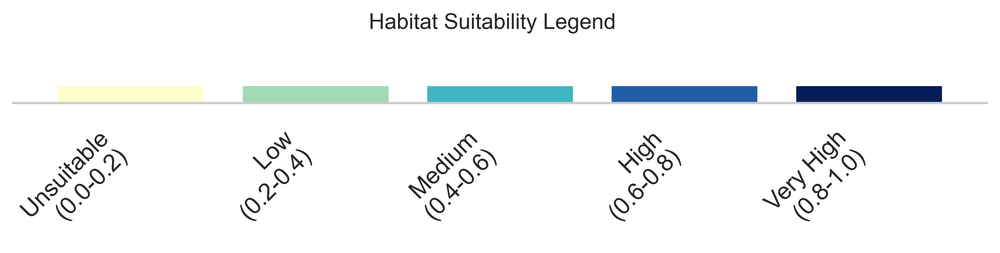

In [31]:
# First, make sure we have inline plotting enabled
%matplotlib inline
plt.rcParams['figure.dpi'] = 300  # Set high DPI for notebook display

def plot_prediction_maps(year, SPCD, species_name, display_inline=True):
    test_ids = ["126", "245", "370"]
    
    # Increase figure size and DPI for better quality
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=300)
    fig.suptitle(f'Predicted Distribution of {species_name} under Different Climate Scenarios', 
                 fontsize=20, y=1.05)
    
    for idx, test_id in enumerate(test_ids):
        test_data = pd.read_csv(f'dataset/predictions_{test_id}.csv')
        predictions = pd.read_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv')
        
        # Increase grid resolution
        grid_size = 0.05  # Decreased from 0.1 for higher resolution
        test_data['Longitude'] = test_data['Longitude'].round(3)
        test_data['Latitude'] = test_data['Latitude'].round(3)
        
        longmax = test_data['Longitude'].max()
        longmin = test_data['Longitude'].min()
        latmax = test_data['Latitude'].max()
        latmin = test_data['Latitude'].min()
        
        longgrid = np.arange(longmin, longmax+grid_size, grid_size)
        latgrid = np.arange(latmin, latmax+grid_size, grid_size)
        X, Y = np.meshgrid(longgrid, latgrid)
        Z = np.zeros((latgrid.size, longgrid.size))
        Z.fill(-9999)
        
        for i, row in test_data.iterrows():
            ilo = np.searchsorted(longgrid, row['Longitude'])
            ila = np.searchsorted(latgrid, row['Latitude'])
            if ila < Z.shape[0] and ilo < Z.shape[1]:
                Z[ila,ilo] = predictions['Predict'].iloc[i]
        
        # Create basemap with lower resolution
        m = Basemap(llcrnrlon=longmin, llcrnrlat=latmin,
                   urcrnrlon=longmax, urcrnrlat=latmax,
                   projection='merc', resolution='l', ax=axes[idx])  # Changed from 'h' to 'l'
        
        # Add map features
        m.drawcoastlines(color='black', linewidth=0.5)
        m.drawcountries(color='black', linewidth=0.5)
        m.drawstates(color='gray', linewidth=0.3)
        m.fillcontinents(color='lightgray', alpha=0.3)
        m.drawmapboundary(fill_color='white')
        
        # More detailed contour levels and custom colormap
        levels = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
        colors = ['#FFFFFF', '#FFFFCC', '#A1DAB4', '#41B6C4', '#225EA8', '#081D58']
        cs = m.contourf(X, Y, Z, levels=levels, 
                       colors=colors,
                       extend='both',
                       alpha=0.7)
        
        # Add colorbar with better formatting
        cbar = plt.colorbar(cs, ax=axes[idx])
        cbar.set_label('Habitat Suitability', fontsize=12)
        cbar.ax.tick_params(labelsize=10)
        
        # Add gridlines
        parallels = np.arange(int(latmin), int(latmax)+1, 2)
        meridians = np.arange(int(longmin), int(longmax)+1, 2)
        m.drawparallels(parallels, labels=[1,0,0,0], fontsize=8, linewidth=0.2)
        m.drawmeridians(meridians, labels=[0,0,0,1], fontsize=8, linewidth=0.2)
        
        # Improve title formatting
        axes[idx].set_title(f'SSP{test_id} Scenario', fontsize=14, pad=10)
    
    plt.tight_layout()
    
    # Save the figure
    plt.savefig(f'plot/base/{year}/{year}_{SPCD}_future_maps.png', 
                dpi=300, 
                bbox_inches='tight',
                pad_inches=0.2)
    
    # Display inline if requested
    if display_inline:
        plt.show()
    else:
        plt.close()

def create_map_legend(display_inline=True):
    fig, ax = plt.subplots(figsize=(8, 2))
    fig.suptitle('Habitat Suitability Legend', fontsize=12)
    
    categories = ['Unsuitable\n(0.0-0.2)', 'Low\n(0.2-0.4)', 'Medium\n(0.4-0.6)', 
                 'High\n(0.6-0.8)', 'Very High\n(0.8-1.0)']
    colors = ['#FFFFCC', '#A1DAB4', '#41B6C4', '#225EA8', '#081D58']
    
    for i, (cat, col) in enumerate(zip(categories, colors)):
        ax.bar(i, 1, color=col, label=cat)
    
    ax.set_xticks(range(len(categories)))
    ax.set_xticklabels(categories, rotation=45, ha='right')
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(f'plot/base/{year}/legend.png', dpi=300, bbox_inches='tight')
    
    # Display inline if requested
    if display_inline:
        plt.show()
    else:
        plt.close()

# Run the visualizations with inline display
print("Generating and displaying high-resolution visualizations...")
try:
    plot_prediction_maps(year, SPCD, species_name[SPCD], display_inline=True)
    create_map_legend(display_inline=True)
except Exception as e:
    print(f"Error occurred: {str(e)}")
    print("\nTrying alternative approach...")
    # If you want to add an alternative visualization method here

Checking predictions before plotting...
Verifying prediction data...

SSP126:
Number of predictions: 285927
Value range: 0.999 to 1.000
Mean value: 1.000

SSP245:
Number of predictions: 285927
Value range: 0.999 to 1.000
Mean value: 1.000

SSP370:
Number of predictions: 285927
Value range: 0.999 to 1.000
Mean value: 1.000

Generating and displaying visualizations...
Processing SSP126...
SSP126 Statistics:
Number of points: 285927
Mean prediction: 1.000
Max prediction: 1.000
Min prediction: 0.999
-------------------
Processing SSP245...
SSP245 Statistics:
Number of points: 285927
Mean prediction: 1.000
Max prediction: 1.000
Min prediction: 0.999
-------------------
Processing SSP370...
SSP370 Statistics:
Number of points: 285927
Mean prediction: 1.000
Max prediction: 1.000
Min prediction: 0.999
-------------------


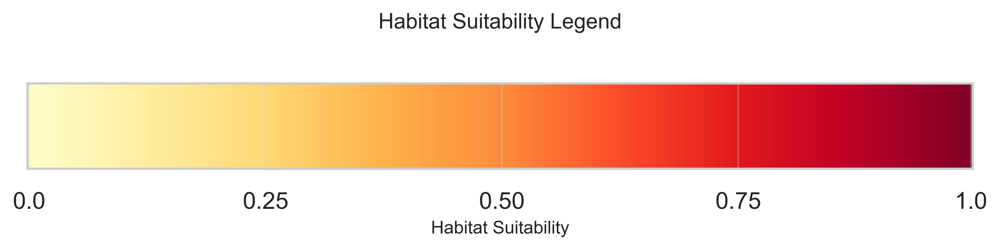

In [32]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 300

def plot_prediction_maps(year, SPCD, species_name, display_inline=True):
    test_ids = ["126", "245", "370"]
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=300)
    fig.suptitle(f'Predicted Distribution of {species_name} under Different Climate Scenarios', 
                 fontsize=20, y=1.05)
    
    for idx, test_id in enumerate(test_ids):
        print(f"Processing SSP{test_id}...")
        
        # Load data
        test_data = pd.read_csv(f'dataset/predictions_{test_id}.csv')
        predictions = pd.read_csv(f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv')
        
        # Set up the map boundaries
        longmax = test_data['Longitude'].max()
        longmin = test_data['Longitude'].min()
        latmax = test_data['Latitude'].max()
        latmin = test_data['Latitude'].min()
        
        # Create basemap
        m = Basemap(llcrnrlon=longmin, llcrnrlat=latmin,
                   urcrnrlon=longmax, urcrnrlat=latmax,
                   projection='merc', resolution='l', ax=axes[idx])
        
        # Draw map features
        m.drawcoastlines(color='black', linewidth=0.5)
        m.drawcountries(color='black', linewidth=0.5)
        m.drawstates(color='gray', linewidth=0.3)
        
        # Convert lat/lon to map coordinates
        x, y = m(test_data['Longitude'].values, test_data['Latitude'].values)
        
        # Create scatter plot of predictions
        scatter = m.scatter(x, y, 
                          c=predictions['Predict'].values,
                          cmap='YlOrRd',  # Changed colormap
                          s=1,  # Smaller point size
                          alpha=0.6,
                          vmin=0,
                          vmax=1)
        
        # Add colorbar
        cbar = plt.colorbar(scatter, ax=axes[idx])
        cbar.set_label('Habitat Suitability', fontsize=12)
        cbar.ax.tick_params(labelsize=10)
        
        # Add gridlines
        parallels = np.arange(int(latmin), int(latmax)+1, 2)
        meridians = np.arange(int(longmin), int(longmax)+1, 2)
        m.drawparallels(parallels, labels=[1,0,0,0], fontsize=8, linewidth=0.2)
        m.drawmeridians(meridians, labels=[0,0,0,1], fontsize=8, linewidth=0.2)
        
        # Add title
        axes[idx].set_title(f'SSP{test_id} Scenario', fontsize=14, pad=10)
        
        # Print some statistics about the predictions
        print(f"SSP{test_id} Statistics:")
        print(f"Number of points: {len(predictions)}")
        print(f"Mean prediction: {predictions['Predict'].mean():.3f}")
        print(f"Max prediction: {predictions['Predict'].max():.3f}")
        print(f"Min prediction: {predictions['Predict'].min():.3f}")
        print("-------------------")
    
    plt.tight_layout()
    
    # Save the figure
    plt.savefig(f'plot/base/{year}/{year}_{SPCD}_future_maps.png', 
                dpi=300, 
                bbox_inches='tight',
                pad_inches=0.2)
    
    if display_inline:
        plt.show()
    else:
        plt.close()

def create_map_legend(display_inline=True):
    fig, ax = plt.subplots(figsize=(8, 2))
    fig.suptitle('Habitat Suitability Legend', fontsize=12)
    
    # Create a gradient instead of discrete categories
    gradient = np.linspace(0, 1, 256)
    gradient = np.vstack((gradient, gradient))
    
    # Plot the gradient
    ax.imshow(gradient, aspect='auto', cmap='YlOrRd')
    
    # Add labels
    ax.set_xticks([0, 64, 128, 192, 255])
    ax.set_xticklabels(['0.0', '0.25', '0.50', '0.75', '1.0'])
    ax.set_yticks([])
    
    ax.set_xlabel('Habitat Suitability', fontsize=10)
    
    plt.tight_layout()
    plt.savefig(f'plot/base/{year}/legend.png', dpi=300, bbox_inches='tight')
    
    if display_inline:
        plt.show()
    else:
        plt.close()

# Let's add some data verification before plotting
def verify_predictions(year, SPCD):
    print("Verifying prediction data...")
    for test_id in ["126", "245", "370"]:
        pred_file = f'result/base/{year}/{year}_{SPCD}_{test_id}_pred.csv'
        if os.path.exists(pred_file):
            preds = pd.read_csv(pred_file)
            print(f"\nSSP{test_id}:")
            print(f"Number of predictions: {len(preds)}")
            print(f"Value range: {preds['Predict'].min():.3f} to {preds['Predict'].max():.3f}")
            print(f"Mean value: {preds['Predict'].mean():.3f}")
        else:
            print(f"\nWarning: Prediction file not found: {pred_file}")

# Run the verification and visualization
print("Checking predictions before plotting...")
verify_predictions(year, SPCD)

print("\nGenerating and displaying visualizations...")
plot_prediction_maps(year, SPCD, species_name[SPCD], display_inline=True)
create_map_legend(display_inline=True)

## 4. Running the Analysis

Now let's run the complete analysis for a specific time period.

In [ ]:
# Set parameters
year = '1991_2020'
SPCDs = [131, 110, 111, 121]
species_name = {131: "loblolly pine", 111: "slash pine", 110: "shortleaf pine", 121: "longleaf pine"}

# Create output directories
os.makedirs('plot_all/base/'+year, exist_ok=True)
os.makedirs('result_all/base/'+year, exist_ok=True)

# Load and preprocess data
x_data, y_data, mean, std = load_and_preprocess_data(year)

# Process each species
for SPCD in SPCDs:
    print(f"\nProcessing {species_name[SPCD]}...")
    
    # Load background points
    with open(f"dataset/background_{SPCD}", "r") as fp:
        non_species = json.load(fp)
    
    # Prepare training data
    species_data = pd.concat([y_data, x_data], axis=1)
    species_data = species_data[species_data['SPCD'] == SPCD]
    non_species_data = species_data[species_data['index'].isin(non_species)]
    non_species_data = non_species_data.assign(PRESENCE=0)
    
    # Balance the dataset
    if SPCD == 131:
        species_data = species_data.sample(n=20000, random_state=42)
    else:
        species_n = {111:14000, 110:24000, 121:10000}
        non_species_data = non_species_data.sample(n=species_n[SPCD], random_state=42)
    
    join_data = pd.concat([species_data, non_species_data], axis=0)
    
    # Prepare features and target
    x_train = join_data.iloc[:,6:]
    y_train = join_data.iloc[:,5]
    
    # Train and evaluate models
    results, stats_label = train_and_evaluate_models(x_train, y_train)
    
    # Plot results
    plot_model_comparison(results, stats_label, species_name[SPCD], year)
    
    # Save results to CSV
    results_df = pd.DataFrame(results, index=stats_label).T
    results_df.to_csv(f'result_all/base/{year}/{year}_{SPCD}_metrics.csv')
    
    # Clean up memory
    gc.collect()